<a href="https://colab.research.google.com/github/yaya1721/ML-spring22/blob/main/ML_assignment5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning Assignment 5
Dania Herzalla dh2741 <br>
Long Phan lvp243 <br>
Sonya Hsieh yh3529 <br>


## Problem 1 & 2 & 3
finished

# Problem 4

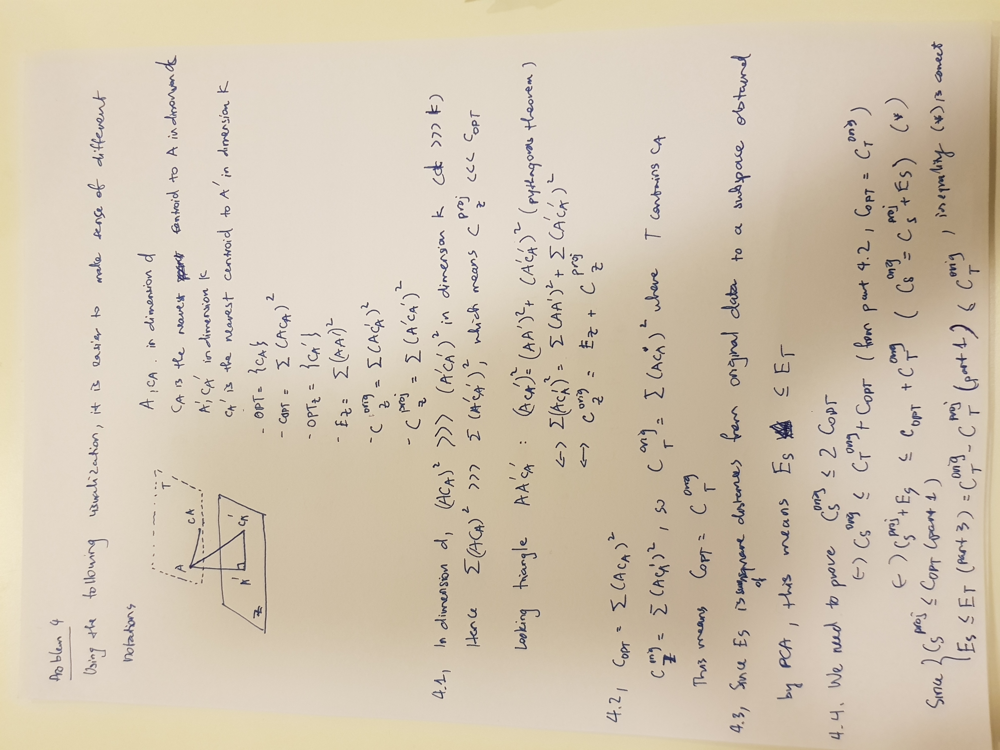

## Problem 5

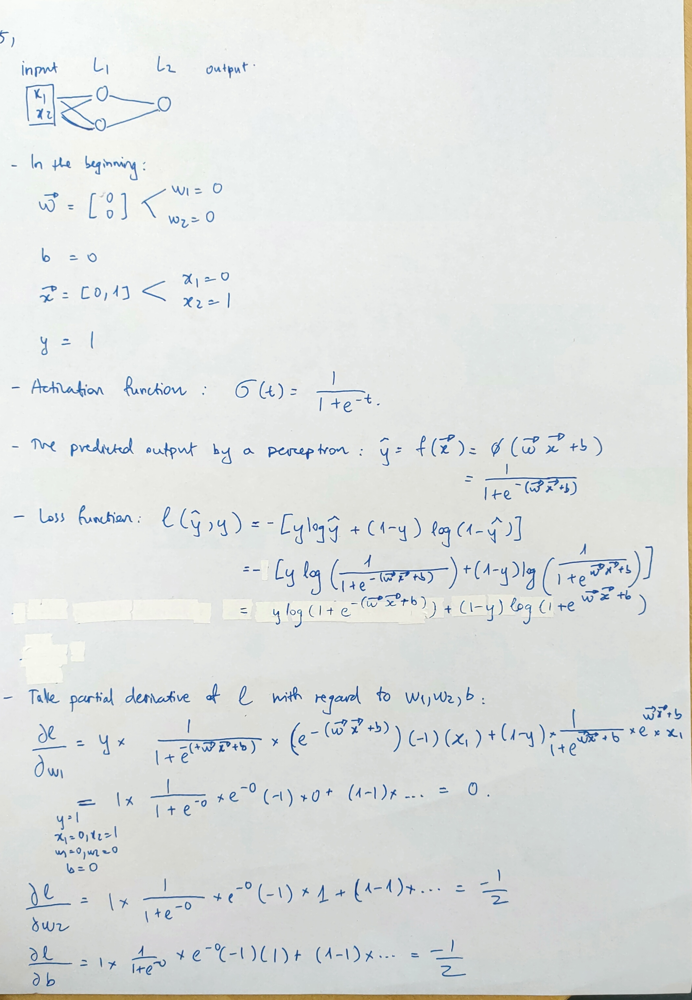

## Problem 6

Part a & b

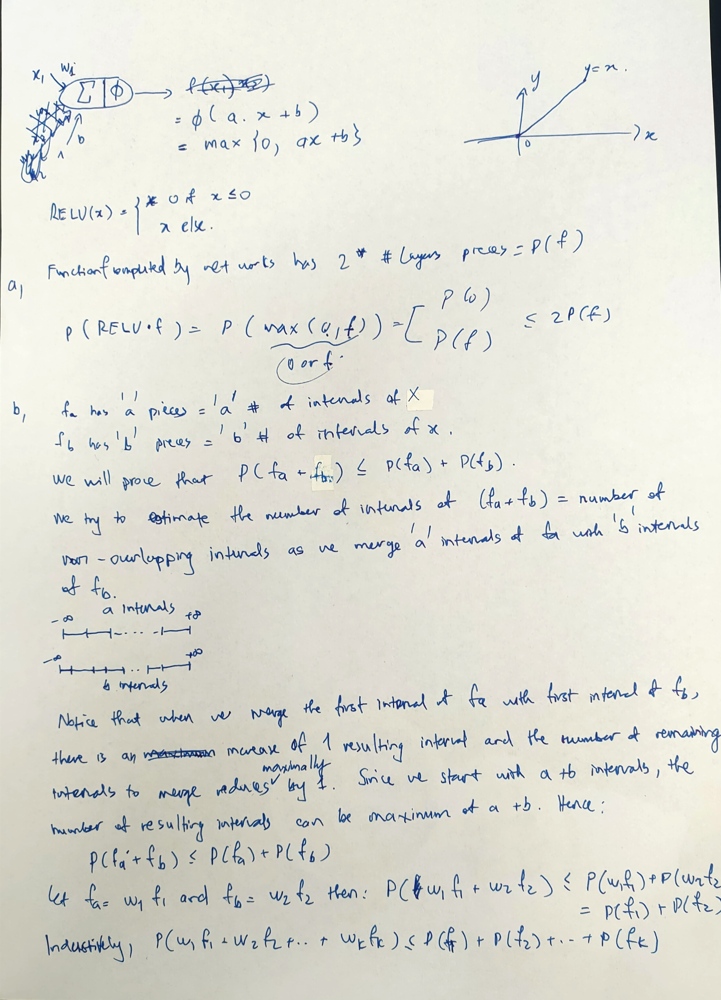

Part c & d

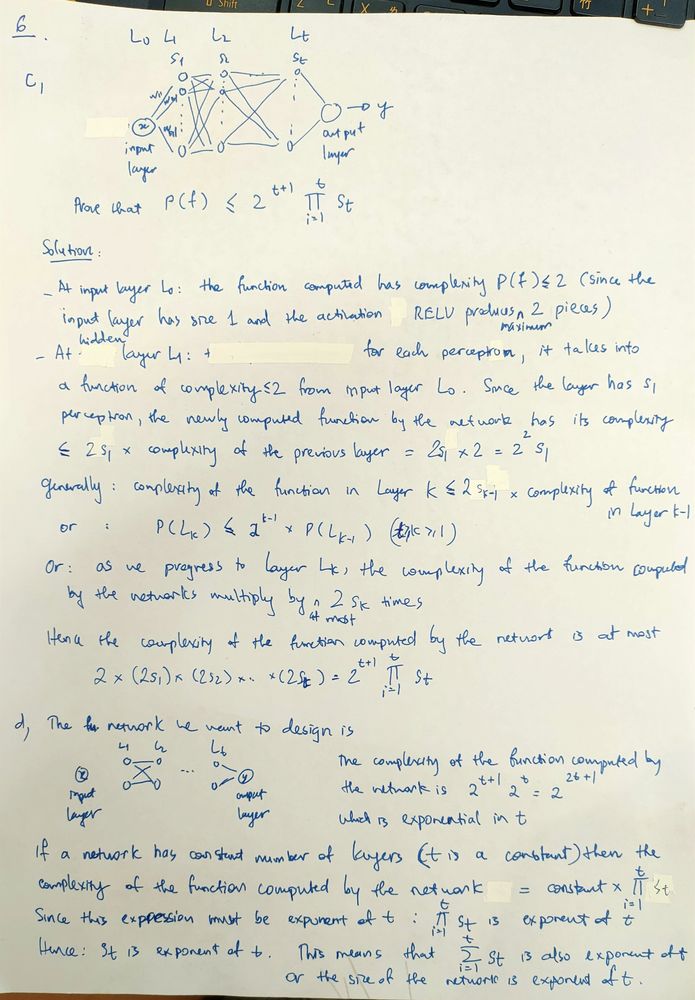

## Problem 7

In [ ]:
from keras.datasets import cifar10
from keras.utils.np_utils import to_categorical
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from PIL import Image
import math
import numpy as np
import pandas as pd
from sklearn import model_selection, preprocessing

In [ ]:
num_classes = 10
classes = {0:"airplane", 1:"automobile", 2:"bird",3:"cat", 4:"deer",\
           5:"dog", 6:"frog", 7:"horse", 8:"ship", 9:"truck"}

# The data, shuffled and split between train and test sets:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# transform integer labels into vector labels
x_train = x_train.astype('float32')/255
y_train_onehot = to_categorical(y_train, num_classes) 

x_test = x_test.astype('float32')/255
y_test_onehot = to_categorical(y_test, num_classes) 

print('x_train shape:', x_train.shape)
print('y_train shape', y_train.shape)
print('y_train_onehot shape:', y_train_onehot.shape)
print('x_test shape:', x_test.shape)
print('y_train shape', y_test.shape)
print('y_test_onehot shape:', y_test_onehot.shape)

170508288/170498071 [==============================] - 4s 0us/step
x_train shape: (50000, 32, 32, 3)
y_train shape (50000, 1)
y_train_onehot shape: (50000, 10)
x_test shape: (10000, 32, 32, 3)
y_train shape (10000, 1)
y_test_onehot shape: (10000, 10)


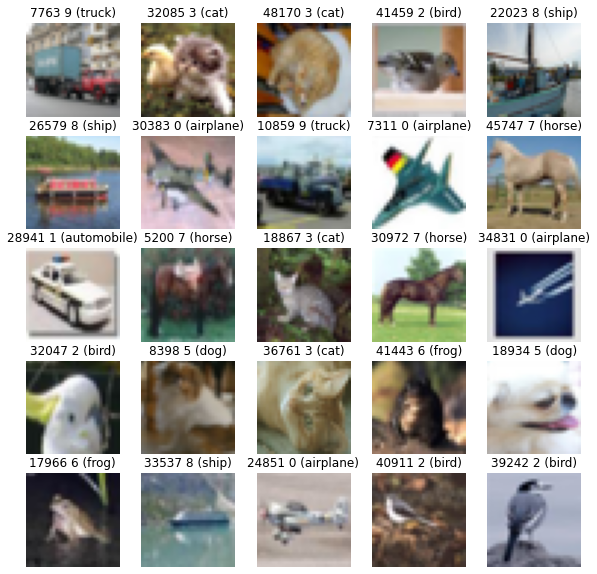

In [ ]:
pltsize=2
row_images = 5
col_images = 5
plt.figure(figsize=(col_images*pltsize, row_images*pltsize))

for i in range(row_images * col_images):
    i_rand = random.randint(0, x_train.shape[0])
    plt.subplot(row_images,col_images,i+1)
    plt.axis('off')
    plt.imshow(x_train[i_rand])
    plt.title(str(i_rand) + " " + str(y_train[i_rand][0])\
              + " (" + classes[y_train[i_rand][0]] + ")")

Train a feedforward neural network <br> 
refered to https://pyimagesearch.com/2021/05/06/implementing-feedforward-neural-networks-with-keras-and-tensorflow/

In [ ]:
'''
tf.keras.layers.Dense(
    units,
    activation=None,
    use_bias=True,
    kernel_initializer="glorot_uniform",
    bias_initializer="zeros",
    kernel_regularizer=None,
    bias_regularizer=None,
    activity_regularizer=None,
    kernel_constraint=None,
    bias_constraint=None,
    **kwargs
)
'''

# define the neural network architecture using Keras
from keras import models, layers, optimizers, regularizers
model = models.Sequential()
model.add(layers.Dense(1024, input_shape=(3072,), activation="relu")) #first layer learning 1024 weights
model.add(layers.Dense(512, activation="relu")) #second layer learning 512 weights
model.add(layers.Dense(10, activation="softmax")) #final layer corresponding to 10 possible outputs with a softmax classifer

# reshape data
x_train_reshape = x_train.reshape((x_train.shape[0], 3072)) #(50000, 32, 32, 3) -> (50000, 3072)
x_test_reshape = x_test.reshape((x_test.shape[0], 3072)) #(10000, 32, 32, 3) -> (10000, 3072)

# convert the labels from integers to vectors
# lb = preprocessing.LabelBinarizer()
# y_train = lb.fit_transform(y_train)
# y_test = lb.transform(y_test)

# train the model using SGD
print("[INFO] training network...")
sgd = tf.keras.optimizers.SGD(0.01) #learning rate, Stochastic gradient descent as optimizer
model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=["accuracy"])
H = model.fit(x_train_reshape, y_train_onehot, validation_data=(x_test_reshape, y_test_onehot), epochs=50, batch_size=64)

[INFO] training network...
Epoch 1/50
782/782 [==============================] - 6s 7ms/step - loss: 1.8851 - accuracy: 0.3270 - val_loss: 1.7678 - val_accuracy: 0.3789
Epoch 2/50
782/782 [==============================] - 5s 6ms/step - loss: 1.7087 - accuracy: 0.3976 - val_loss: 1.8194 - val_accuracy: 0.3551
Epoch 3/50
782/782 [==============================] - 5s 6ms/step - loss: 1.6307 - accuracy: 0.4276 - val_loss: 1.7159 - val_accuracy: 0.3857
Epoch 4/50
782/782 [==============================] - 5s 7ms/step - loss: 1.5766 - accuracy: 0.4459 - val_loss: 1.5731 - val_accuracy: 0.4411
Epoch 5/50
782/782 [==============================] - 5s 6ms/step - loss: 1.5349 - accuracy: 0.4617 - val_loss: 1.6517 - val_accuracy: 0.4065
Epoch 6/50
782/782 [==============================] - 5s 6ms/step - loss: 1.4978 - accuracy: 0.4740 - val_loss: 1.5703 - val_accuracy: 0.4372
Epoch 7/50
782/782 [==============================] - 5s 6ms/step - loss: 1.4656 - accuracy: 0.4846 - val_loss: 1.5406 - 

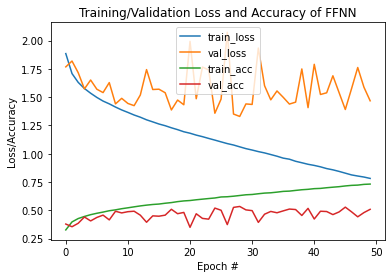

In [ ]:
plt.figure()
plt.plot(H.history["loss"], label="train_loss")
plt.plot(H.history["val_loss"], label="val_loss")
plt.plot(H.history["accuracy"], label="train_acc")
plt.plot(H.history["val_accuracy"], label="val_acc")
plt.title("Training/Validation Loss and Accuracy of FFNN")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

Train a convolutional neural network <br>
referred to: https://machinelearningmastery.com/how-to-develop-a-cnn-from-scratch-for-cifar-10-photo-classification/

In [ ]:
# define a cnn model
image_shape = (32, 32, 3)

cnn_model = models.Sequential([
    layers.Conv2D(filters=32,kernel_size=3,activation='relu', input_shape = image_shape),
    layers.MaxPooling2D(pool_size=2), # down sampling the output instead of 28*28 it is 14*14
    layers.Dropout(0.5),
    layers.Flatten(), # flatten out the layers
    layers.Dense(3072,activation='relu'),
    layers.Dense(10,activation = 'softmax') 
])

# train the model using SGD
print("[INFO] training network...")
sgd = tf.keras.optimizers.SGD(0.01) #learning rate, Stochastic gradient descent as optimizer
cnn_model.compile(loss="categorical_crossentropy", optimizer=sgd, metrics=["accuracy"])

H2 = cnn_model.fit(
    x_train,
    y_train_onehot,
    batch_size = 64,
    epochs = 50,
    verbose=1,
    validation_data=(x_test, y_test_onehot),
)

[INFO] training network...
Epoch 1/50
782/782 [==============================] - 21s 15ms/step - loss: 2.0004 - accuracy: 0.2819 - val_loss: 1.8434 - val_accuracy: 0.3433
Epoch 2/50
782/782 [==============================] - 11s 14ms/step - loss: 1.7416 - accuracy: 0.3868 - val_loss: 1.6038 - val_accuracy: 0.4359
Epoch 3/50
782/782 [==============================] - 11s 14ms/step - loss: 1.5850 - accuracy: 0.4429 - val_loss: 1.5110 - val_accuracy: 0.4578
Epoch 4/50
782/782 [==============================] - 11s 14ms/step - loss: 1.4789 - accuracy: 0.4788 - val_loss: 1.4593 - val_accuracy: 0.4789
Epoch 5/50
782/782 [==============================] - 11s 14ms/step - loss: 1.4068 - accuracy: 0.5028 - val_loss: 1.4228 - val_accuracy: 0.5082
Epoch 6/50
782/782 [==============================] - 11s 15ms/step - loss: 1.3557 - accuracy: 0.5231 - val_loss: 1.3186 - val_accuracy: 0.5310
Epoch 7/50
782/782 [==============================] - 12s 15ms/step - loss: 1.3163 - accuracy: 0.5371 - val_l

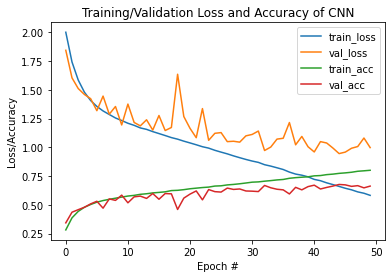

In [ ]:
plt.figure()
plt.plot(H2.history["loss"], label="train_loss")
plt.plot(H2.history["val_loss"], label="val_loss")
plt.plot(H2.history["accuracy"], label="train_acc")
plt.plot(H2.history["val_accuracy"], label="val_acc")
plt.title("Training/Validation Loss and Accuracy of CNN")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

Evaluate the models

In [ ]:
model.evaluate(x_test_reshape, y_test_onehot)
cnn_model.evaluate(x_test, y_test_onehot)

313/313 [==============================] - 2s 7ms/step - loss: 0.9975 - accuracy: 0.6628


[0.9975061416625977, 0.6628000140190125]